## Import required modules

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

from scipy.stats import chi2_contingency
import statsmodels.stats.multitest as smt
import os 
from mpl_toolkits.axes_grid1 import make_axes_locatable

from matplotlib.patches import Rectangle
import itertools

import matplotlib as mpl

import pickle

import warnings
warnings.filterwarnings("ignore",category=mpl.cbook.mplDeprecation)

from fastprogress.fastprogress import progress_bar

from scipy import stats
import statsmodels.stats.multitest as smt
from math import sqrt

import cell2location

import session_info
session_info.show()

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
Global seed set to 0


In [2]:
# import a module given the full path
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/home/jovyan/projects/P46_Adult-heart_Visium/notebooks/ver8regions_torepo/_utils.py")
_utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = _utils
spec.loader.exec_module(_utils)

spec = importlib.util.spec_from_file_location("module.name", "/home/jovyan/projects/P48_Foetal-heart_Visium/notebooks/manual2factor.py")
manual2factor = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = manual2factor
spec.loader.exec_module(manual2factor)

## Prepare functions

In [3]:
import pickle
# save
def save_pkl(obj, file):
    with open(file, "wb") as tf:
        pickle.dump(obj, tf)

# read
def read_pkl(file):
    with open(file, "rb") as tf:
        obj = pickle.load(tf)
    
    return obj

## Variables

In [4]:
annot_dict={
    'epicardium':'epicardium_subepicardium',
    'Epicardium':'epicardium_subepicardium',
    # 'myocardium':'myocardium',
    'fat':'adipose_tissue',
    'Fat':'adipose_tissue',
    'fat_subepicardial':'epicardium_subepicardium',
    'fat_subendocardial':'adipose_tissue',
    # 'fibrosis':'fibrosis',
    'fibrosis_subepicardial':'epicardium_subepicardium',
    'fibrosis_subendocardial':'fibrosis',
    'Fibrosis_subendocardial':'fibrosis',
    'Nerve':'nerve',
    'Vessel':'vessel',
    'Node':'node',
    # 'other_haemorrhage':'other_haemorrhage',
    'AVN':'node',
    # 'AV_bundle':'AV_bundle',
    'AV_bundle_branch_left':'AV_bundle',
    'Endocardium':'endocardium',
    'Haemorrhage':'haemorrhage',
    'Myocardium_atrial':'myocardium_atrial',
    }

In [5]:
region = 'SAN'
slideID = 'HCAHeartST13233996'

cell2loc_out = f'/nfs/team205/heart/cell2location/cell2location_map/cs-selected/{region}_per-slide/{slideID}/sp.h5ad'
path_to_cell2locNMF = f'/nfs/team205/heart/cell2location/coloc_nmf/CoLocatedComb/{region}_revision/{slideID}'
fname = os.listdir(path_to_cell2locNMF)[0]

In [7]:
# read in cell2loc output
adata_vis=sc.read_h5ad(cell2loc_out)
set(adata_vis.obs['annotation_JC'])

{'fat', 'fibrosis', 'myocardium_atrial', 'nerve', 'node', 'vessel'}

## Read in anndata

In [8]:
# read in cell2loc output
adata_vis=sc.read_h5ad(cell2loc_out)

# tidy up adata.var
adata_vis.var = adata_vis.var[[x for x in adata_vis.var.columns if 'SYMBOL' in x]]

# modify annotation
adata_vis.obs['annotation_final']=adata_vis.obs['annotation_JC']
adata_vis.obs.replace({'annotation_final':annot_dict},inplace=True)

adata_vis

AnnData object with n_obs × n_vars = 3052 × 16078
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', '_scvi_batch', '_scvi_labels', '_indices', 'annotation_final'
    var: 'SYMBOL'
    uns: '_scvi', 'mod', 'spatial'
    obsm: 'MT', 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

## Matching manual annotations and unbiased factors

**Statistical significance with permutation test**

In [9]:
%%time
adata_vis, cd_df_all = manual2factor.manual2factor(
                                        adata=adata_vis,
                                        path_to_cell2locNMF=path_to_cell2locNMF,
                                        manual_annotation_column='annotation_final',
                                        mannual_rois='all',
                                        n_permute=1000,
                                        adjp_thresh = 0.01,
                                        n_factor_min = 5,
                                        n_factor_max = 15,
                                        plot_heatmap=False
                                    )

matching n_fact5


matching n_fact6


matching n_fact7


matching n_fact8


matching n_fact9


matching n_fact10


matching n_fact11


matching n_fact12


matching n_fact13


matching n_fact14


CPU times: user 2min 2s, sys: 438 ms, total: 2min 3s
Wall time: 2min 4s


/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/pandas/core/frame.py:3641: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`


In [10]:
l = list(cd_df_all.columns)
l.sort()
l

['adipose_tissue', 'fibrosis', 'myocardium_atrial', 'nerve', 'node', 'vessel']

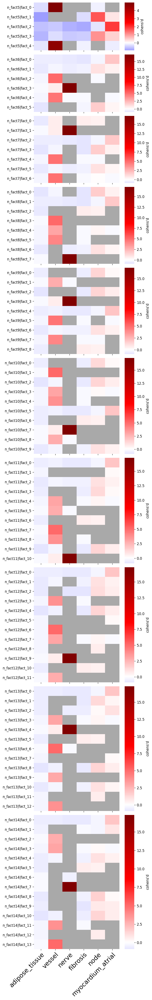

In [12]:
# plot for each structure

n_facts = ['n_fact5','n_fact6','n_fact7','n_fact8','n_fact9',
          'n_fact10','n_fact11','n_fact12','n_fact13','n_fact14']

fig, axs = plt.subplots(nrows=len(n_facts), sharex=True, figsize=(6, 40), dpi=120,
                       gridspec_kw={'height_ratios': [5,6,7,8,9,10,11,12,13,14]})
cmap = mpl.cm.get_cmap("seismic")
cmap.set_bad(color='darkgrey')

for i,f in enumerate(n_facts):
    df = cd_df_all.loc[[x for x in cd_df_all.index if x.split('|')[0]==f]]
    
    mask = df.isnull()
    sns.heatmap(df, cmap=cmap, mask=mask, center=0, cbar_kws={'label': "cohens'd",'aspect':int(f.split('n_fact')[1])}, 
                ax=axs[i])
    # axs[i].set_title(ROI)
    axs[i].set_yticklabels(axs[i].get_yticklabels(),rotation=0)
    axs[i].set_xticklabels(axs[i].get_xticklabels(),rotation=45,ha='right', rotation_mode='anchor', fontsize=18)

plt.tight_layout()
plt.savefig(f"/home/jovyan/projects/P46_Adult-heart_Visium/notebooks/Revision/figures/{region}-{slideID}_factors-structures_heatmap.pdf", 
            format='pdf', )
plt.show()


In [13]:
np.max(cd_df_all)

adipose_tissue       -0.168908
vessel                5.052028
nerve                17.309884
fibrosis              0.666118
node                  1.745703
myocardium_atrial     1.922508
dtype: float64

## Find good factors for each structural annotation

In [64]:
# factor number per structure = 4
n_goodfactor_df, goodfactors_dict = manual2factor.find_good_factors(
                                        factor_manual_df=cd_df_all,
                                        cohensd_thresh=0.8,
                                        ratio_to_top=0.5,
                                        n_factor_min = 5,
                                        n_factor_max = 15,
                                        n_dividing = 2
                                    )
goodfactors_dict

{'vessel': ['n_fact5|fact_0', 'n_fact5|fact_4'],
 'nerve': ['n_fact14|fact_7'],
 'node': ['n_fact5|fact_1', 'n_fact5|fact_3'],
 'myocardium_atrial': ['n_fact13|fact_0', 'n_fact13|fact_2']}

## Plot single factor-structure matrix

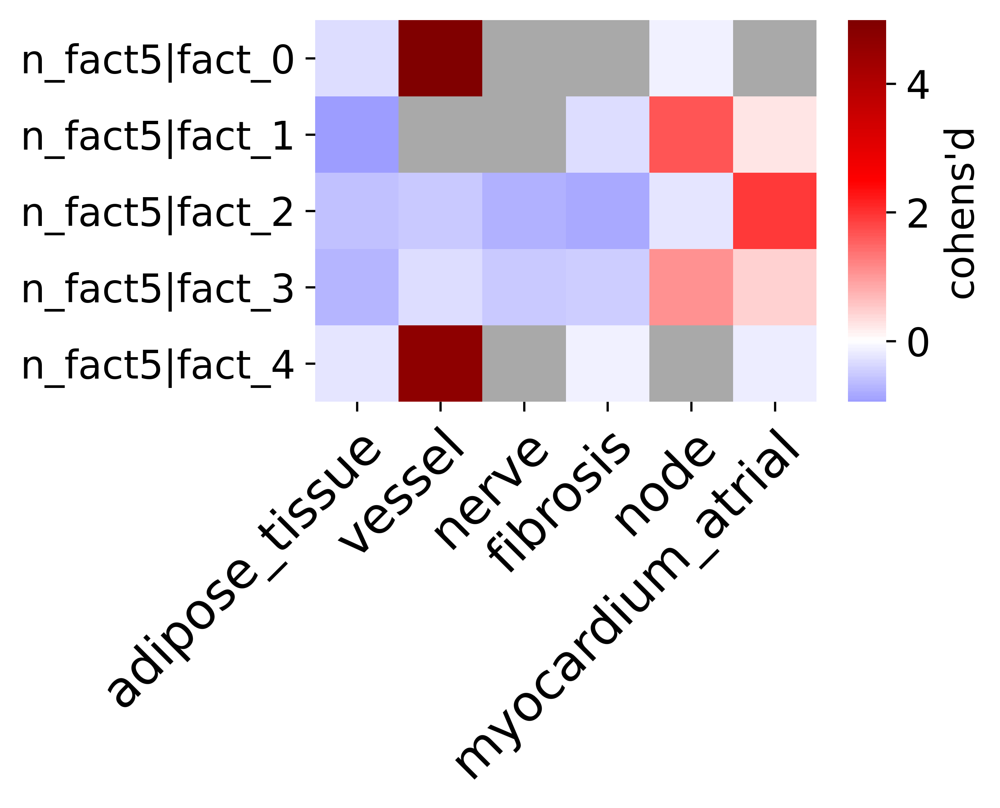

In [45]:
# plot for each structure

nfact = 'n_fact5'

fig, axs = plt.subplots(nrows=1, sharex=True, figsize=(4, 2.5), dpi=300)
cmap = mpl.cm.get_cmap("seismic")
cmap.set_bad(color='darkgrey')

df = cd_df_all.loc[[x for x in cd_df_all.index if x.split('|')[0]==nfact]]

mask = df.isnull()
sns.heatmap(df, cmap=cmap, mask=mask, center=0, cbar_kws={'label': "cohens'd",'aspect':10})
# axs[i].set_title(ROI)
plt.gca().set_yticklabels(plt.gca().get_yticklabels(),rotation=0)
plt.gca().set_xticklabels(plt.gca().get_xticklabels(),rotation=45,ha='right', rotation_mode='anchor', fontsize=18)

plt.savefig(f"/home/jovyan/projects/P46_Adult-heart_Visium/notebooks/Revision/figures/{region}-{slideID}_{nfact}_factors-structures_heatmap.pdf", 
            format='pdf', )
plt.show()


## Plot visium slide

In [17]:
sc.set_figure_params(dpi=300)

In [ ]:
'''
### ver 20220718 ###

colormap='tab20'
palette={}
palette['adipose_tissue']=plt.get_cmap(colormap).colors[0]
palette['endocardium']=plt.get_cmap(colormap).colors[1]
palette['epicardium_subepicardium']=plt.get_cmap(colormap).colors[2]
palette['fibrosis']=plt.get_cmap(colormap).colors[3]
palette['myocardium']=plt.get_cmap(colormap).colors[5]
palette['nerve']=plt.get_cmap(colormap).colors[4]
palette['node']=plt.get_cmap(colormap).colors[6]
palette['vessel']=plt.get_cmap(colormap).colors[7]
palette['AV_bundle']=plt.get_cmap(colormap).colors[8]
palette['myocardium_atrial']=plt.get_cmap(colormap).colors[9]
palette['myocardium_ventricular']=plt.get_cmap(colormap).colors[10]
palette['cardiac_skeleton']=plt.get_cmap(colormap).colors[11]
'''

vessel


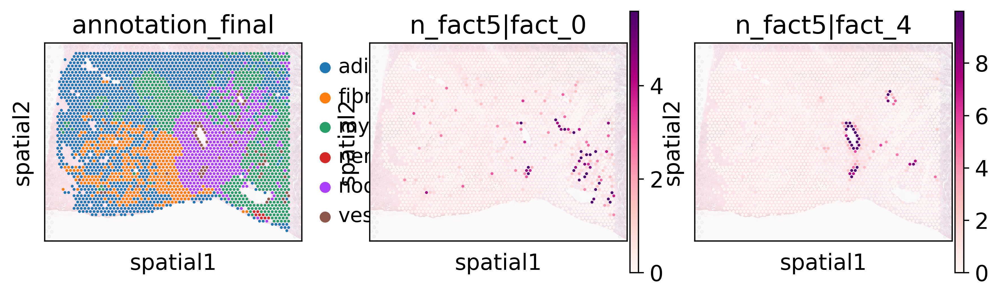

nerve


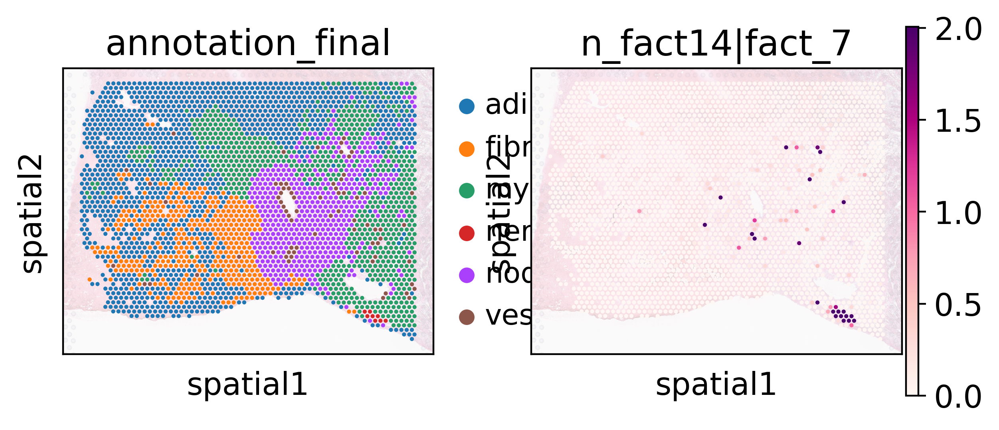

node


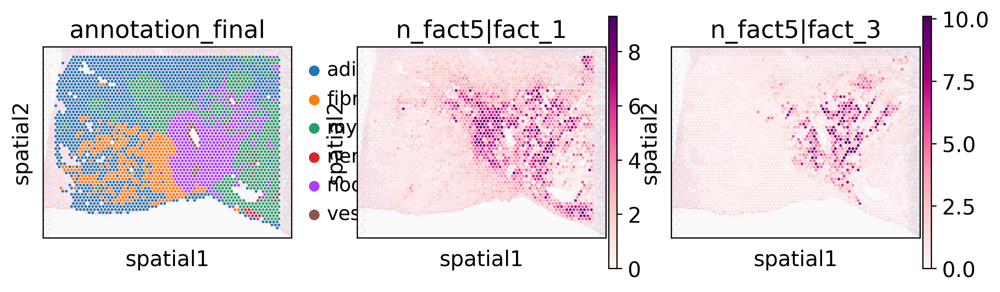

myocardium_atrial


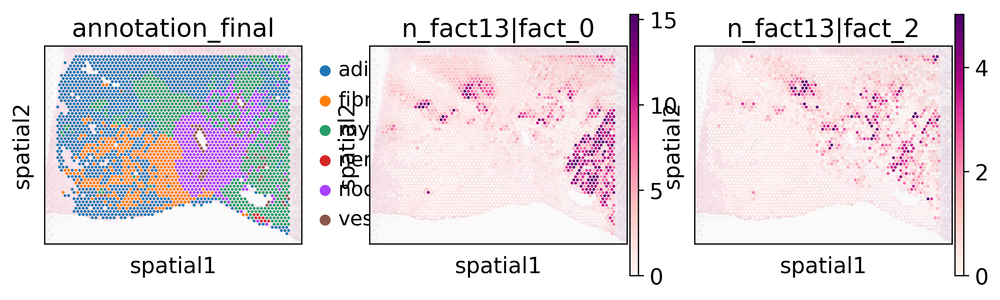

In [46]:
slide = adata_vis.copy()

for k in goodfactors_dict.keys():
    print(k)
    
    if len(goodfactors_dict[k])>0:

        with mpl.rc_context({'figure.figsize': [3, 3],
                            'axes.titlesize':16,}):

            sc.pl.spatial(slide,cmap='RdPu',
                          color=['annotation_final']+goodfactors_dict[k], 
                          ncols=6, wspace=0.15,
                          size=1.2,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.4')

## Rename factors

In [47]:
# select structures of interest

structures_of_interest = ['node']

goodfactors_dict_rename = {}
for k in structures_of_interest:
    goodfactors_dict_rename[k] = goodfactors_dict[k]
    
goodfactors_dict_rename

{'node': ['n_fact5|fact_1', 'n_fact5|fact_3']}

In [48]:
# make factor2name dictionary
factor2name = {}
factor2name['n_fact5|fact_1']='Peripheral node'
factor2name['n_fact5|fact_3']='Central node'

In [49]:
# rename

## anndata
adata_rename = adata_vis.copy()
adata_rename.obs.rename(columns=factor2name,inplace=True)

## cohensd dataframe
cd_df_all_rename = cd_df_all.copy()
cd_df_all_rename.rename(index=factor2name,inplace=True)
### reorder columns
l=list(cd_df_all_rename.columns)
l.sort()
cd_df_all_rename = cd_df_all_rename[l]

## goodfactors_dict
for k in goodfactors_dict_rename.keys():
    goodfactors_dict_rename[k]=[factor2name[x] for x in goodfactors_dict_rename[k] if x in factor2name.keys()]
goodfactors_dict_rename

{'node': ['Peripheral node', 'Central node']}

## Plot renamed factors

node


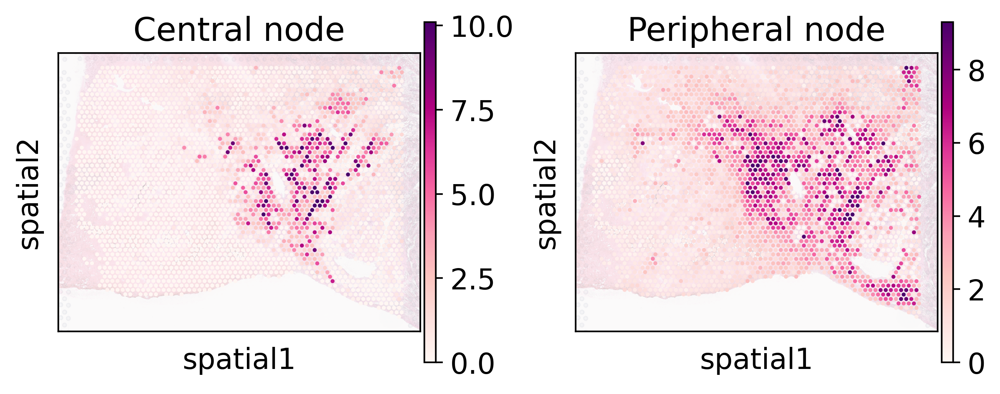

In [50]:
slide = adata_rename.copy()

for k in goodfactors_dict_rename.keys():
    print(k)
    
    if len(goodfactors_dict_rename[k])>0:

        with mpl.rc_context({'figure.figsize': [3, 3],
                            'axes.titlesize':16,}):

            sc.pl.spatial(slide,cmap='RdPu',
                          color=['Central node','Peripheral node'], 
                          ncols=6, wspace=0.3,
                          size=1.2,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.4',
                         save=f'_SAN_{slideID}_factorplot_{k}.pdf')

## Plot co-locating cells

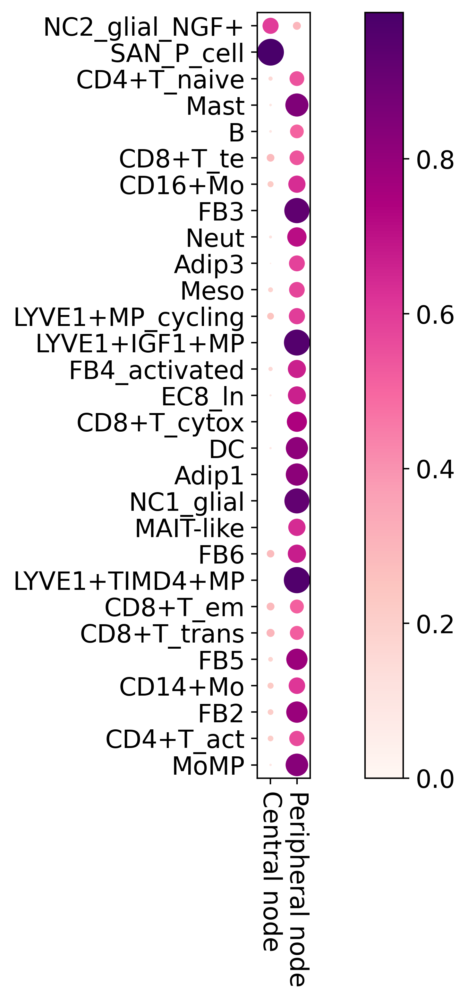

In [70]:
# Colocation, factor-by-cell dotplot
ROIs = ['node']
weight_thresh=0.5

for i,ROI in enumerate(ROIs):
    
    factors=[]
    for k in factor2name.keys():
        if ROI in factor2name[k]:
            factors=factors+[k] 
    
    nfact = factors[0].split('|')[0].split('n_fact')[1]
    
    fname=os.listdir(path_to_cell2locNMF)[0]
    df = pd.read_csv(f'{path_to_cell2locNMF}/{fname}/cell_type_fractions_mean/n_fact{nfact}.csv',index_col=0)
    df.columns=[x.replace('mean_cell_type_factors',f'n_fact{nfact}|') for x in df.columns]
    df = df[factors]
    df.rename(columns=factor2name, inplace=True)
    
    
    if i==0:
        df_all=df.copy()
    else:
        df_all = pd.concat([df_all,df],axis=1)
    
    del df

# filter dataframe based on the weight values
# take cell states if any of the factors has above than the threshold
df_all=df_all[df_all.apply(lambda x:any(x>weight_thresh),axis=1)]

plt.rcParams["figure.dpi"] = 200
cell2location.plt.plot_heatmap.clustermap(df_all,cluster_rows=True,
                    cluster_cols=False,fun_type='dotplot',figure_size=(9,8))

In [87]:
# for each factor, select top 15 cells which are more than the weight threshold
# to reduce the cell states to plot
central_top = list(df_all[df_all['Central node']>weight_thresh].sort_values('Central node',ascending=False).index[:15])
print(central_top)
peri_top = list(df_all[df_all['Peripheral node']>weight_thresh].sort_values('Peripheral node',ascending=False).index[:15])
print(peri_top)

['SAN_P_cell', 'NC2_glial_NGF+']
['LYVE1+TIMD4+MP', 'LYVE1+IGF1+MP', 'FB3', 'NC1_glial', 'Mast', 'MoMP', 'Adip1', 'DC', 'FB2', 'FB5', 'CD8+T_cytox', 'Neut', 'FB6', 'FB4_activated', 'EC8_ln']


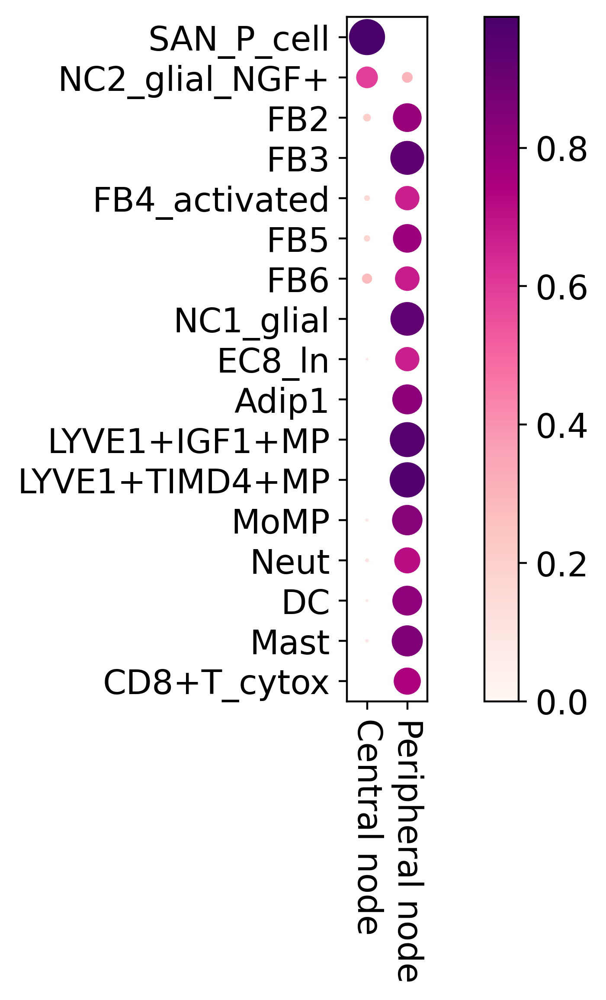

In [89]:
# reorder
row_order = ['SAN_P_cell','NC2_glial_NGF+','FB2', 'FB3', 'FB4_activated', 'FB5','FB6','NC1_glial','EC8_ln','Adip1',
            'LYVE1+IGF1+MP','LYVE1+TIMD4+MP','MoMP','Neut','DC', 'Mast', 'CD8+T_cytox']
column_order = ['Peripheral node','Central node']
cell2location.plt.plot_heatmap.clustermap(df_all.loc[row_order,column_order], 
                                          cluster_rows=False,cluster_cols=False,fun_type='dotplot',figure_size=(7,6))
plt.savefig(f"/home/jovyan/projects/P46_Adult-heart_Visium/notebooks/Revision/figures/{region}-{slideID}_{nfact}_coloc-cells.pdf", 
            format='pdf', )

## Save matched factors

In [ ]:
# save factors
save_pkl(goodfactors_dict, 
         f'/nfs/team205/heart/cell2location/coloc_nmf/selected_factors/SAN_revision/{region}_{slideID}_sel-factors_dict.pkl')

# save colocating cells
with open(f'/nfs/team205/heart/cell2location/coloc_nmf/selected_factors/SAN_revision/{region}_{slideID}_coloc-cells.txt', 'w') as f:
    for line in df_all.index:
        f.write(line)
        f.write('\n')

In [ ]:
goodfactors_dict

In [ ]:
df_all.index